In [1]:
# for auto-reloading extenrnal modules
# see http://stackoverflow.com/questions/1907993/autoreload-of-modules-in-ipython
%load_ext autoreload
%autoreload 2

# Render matplotlibs inline
%matplotlib inline

In [2]:
from data_utils import parse_files
import numpy as np
import os
import IPython
import matplotlib.pyplot as plt
import librosa
fs = 44100

In [3]:
def displayAudio(aud, label='', n_seconds=10, fs=fs):
  if label:
    print label
  IPython.display.display(IPython.display.Audio(data=aud[:fs * n_seconds], rate=fs))

In [4]:
path = 'datasets/YourMusicLibrary/wave/'
filename = os.listdir(path)[0]
# filename = 'datasets/YourMusicLibrary/wave/33 - Fugue - Op.P3 No.2 - in Am (BI 144).wav'
data, bitrate = librosa.load(path + filename, sr=None)
print filename,':', data.shape, bitrate, np.min(data), np.max(data), data.dtype

12 - Nocturne No.20 - Op.P1 No.16 - in C#m (BI 49).wav : (10559304,) 44100 -0.232483 0.217651 float32


In [5]:
# Test fourier transform process
displayAudio(data, 'Original')
time_blocks = parse_files.convert_np_audio_to_sample_blocks(data, 1024)
print 'time_blocks shape:', np.asarray(time_blocks).shape
ft_blocks = parse_files.time_blocks_to_fft_blocks(time_blocks)
print 'ft_blocks shape:', np.asarray(ft_blocks).shape
time_blocks = parse_files.fft_blocks_to_time_blocks(ft_blocks)
print 'time_blocks shape:', np.asarray(time_blocks).shape
song = parse_files.convert_sample_blocks_to_np_audio(time_blocks)
displayAudio(song, 'Processed')

Original


time_blocks shape: (10312, 1024)
ft_blocks shape: (10312, 2048)
time_blocks shape: (10312, 1024)
Processed


/home/ben/anaconda2/envs/ml/lib/python2.7/site-packages/IPython/lib/display.py:123: ComplexWarning: Casting complex values to real discards the imaginary part
  data = np.array(data, dtype=float)


hop 1/4 (2049, 431) complex64
(2049, 431) float32
hop 1x (2049, 108) complex64
(2049, 108) float32


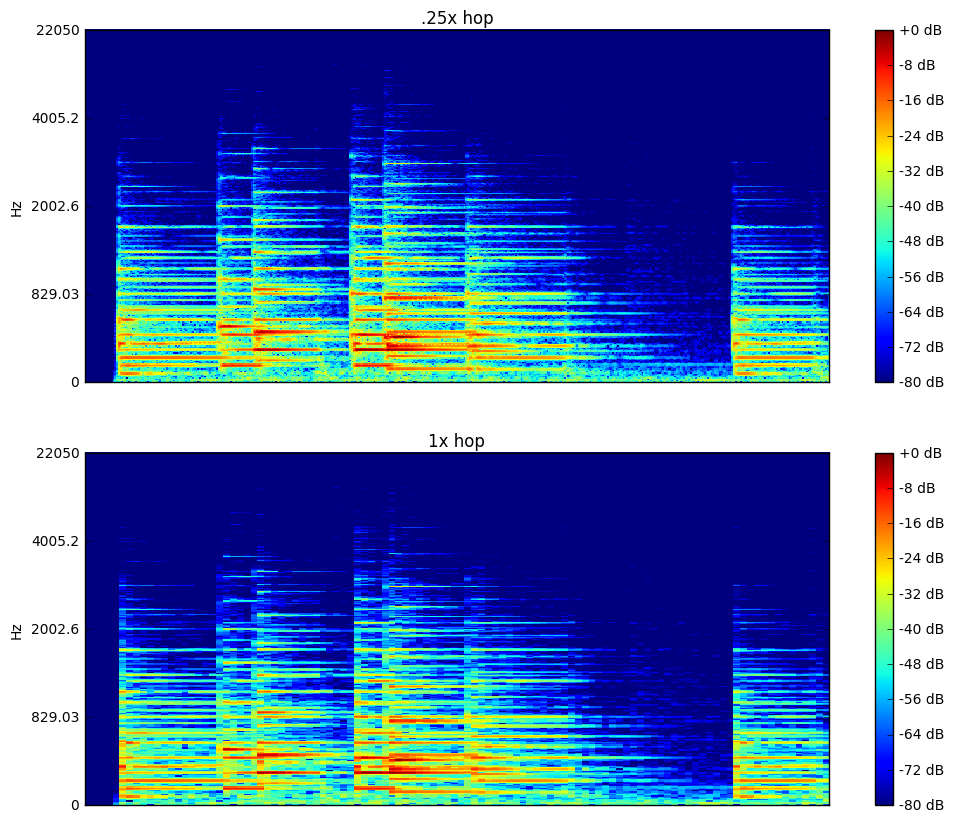

In [6]:
window_size = 4096 # window size, default 2048 == 46 ms
num_seconds = 10
# Visualize
plt.figure(figsize=(12, 10))
plt.subplot(211)
ft = librosa.stft(data[:fs*num_seconds], n_fft=window_size, hop_length=window_size/4)
print 'hop 1/4', ft.shape, ft.dtype
D = librosa.logamplitude(np.abs(ft)**2, ref_power=np.max)
print D.shape, D.dtype
#plt.subplot(4, 2, 1)
librosa.display.specshow(D, sr=fs, cmap='jet', y_axis='log')
plt.colorbar(format='%+2.0f dB')
plt.title('.25x hop')

# Visualize
plt.subplot(212)
# num frequency bins == window_size / 2
# ft.shape[1] = num_seconds * fs / hop_length
ft = librosa.stft(data[:fs*num_seconds], n_fft=window_size, hop_length=window_size)
# TODO: try setting upper frequencies to zeros
print 'hop 1x', ft.shape, ft.dtype
D = librosa.logamplitude(np.abs(ft)**2, ref_power=np.max)
print D.shape, D.dtype
librosa.display.specshow(D, sr=fs, cmap='jet', y_axis='log')
plt.colorbar(format='%+2.0f dB')
plt.title('1x hop')

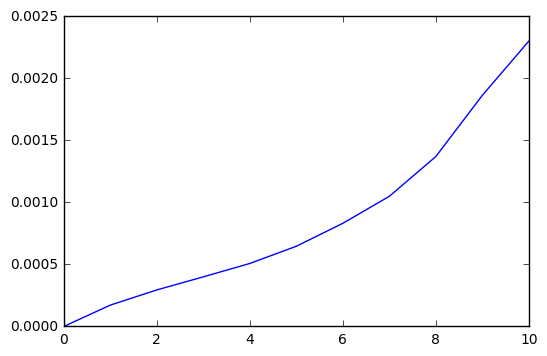

factor 7 saving 292 / 2049 bins capped at 3150 Hz


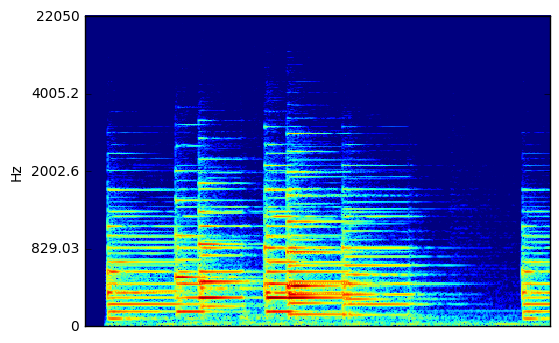

In [7]:
# Zero out high frequencies, reconstruct. Highest piano note is 4186
ft = librosa.stft(data, n_fft=window_size, hop_length=window_size/4)
num_freq = ft.shape[0]
def getError(ft, factor=7):
    ft_copy = np.copy(ft)
    ft_copy[num_freq/factor:, :] = 0
    # Use np.abs to extract real/magnitude component, then compute MSE
    return np.mean(np.abs(ft - ft_copy))

plt.plot([getError(ft, i) for i in range(1,12)])
#plt.yscale('log')
plt.show()
factor = 7
print 'factor', factor, 'saving', num_freq/factor, '/', num_freq, 'bins capped at', fs / 2 / factor, 'Hz'
D = librosa.logamplitude(np.abs(ft[:, :fs/window_size*4*num_seconds])**2, ref_power=np.max)
librosa.display.specshow(D, sr=fs, cmap='jet', y_axis='log')
song = librosa.istft(ft)
# displayAudio(song, 'Processed', n_seconds=50)

In [8]:
from scipy.signal import spline_filter

stft shape (2049, 10312)
43.06640625 samples/second
323 samples 5168 repeated
32x linear downsampling


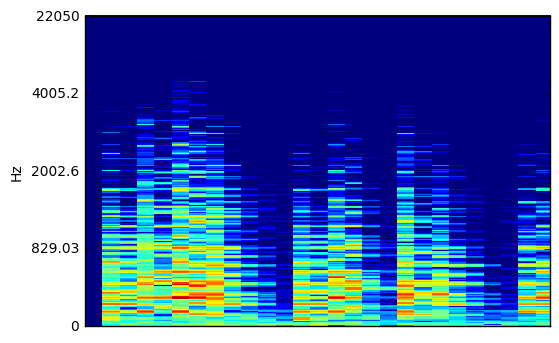

In [9]:
# Linear downsampling
ft = librosa.stft(data, n_fft=window_size, hop_length=window_size/4)
print 'stft shape', ft.shape
num_freq = ft.shape[0]
total_samples = ft.shape[1]
# time/frequency domain samples/sec
tf_fs = fs * 1. / window_size * 4
print tf_fs, 'samples/second'
sample_factor = 32
sampled = np.copy(ft[:, ::sample_factor])
# Repeat sample factor / 2 since hop length delta accounts for 2x
repeated = np.repeat(sampled, int(sample_factor / 2), axis=1)
print sampled.shape[1], 'samples', repeated.shape[1], 'repeated'
# Render spectrogram of first 10 seconds
D = librosa.logamplitude(np.abs(repeated[:,:int(tf_fs * 10)])**2, ref_power=np.max)
librosa.display.specshow(D, sr=fs, cmap='jet', y_axis='log')
# Reconstruct
song = librosa.istft(repeated, win_length=window_size, hop_length=window_size / 2)
displayAudio(song, '%dx linear downsampling' % sample_factor, n_seconds=10)

In [153]:
def reverseTriangle(x):
    '''Solve for x.'''
    return .5 * ((8*x + 1) ** .5 - 1)

def triangle(n):
    '''Like factorial but for addition.'''
    return n * (n + 1) / 2

def sample(n, block_size=16):
    '''Creates an "exponential" sampling index and this index inflated to the size of the original.
    With block_size=16, n=10k -> result.shape = 557
    Decrease block_size for fewer samples.
    '''
    max_index = n - 1
    
    b = np.zeros(reverseTriangle(n * block_size))
    b[:block_size] = np.arange(block_size)
    full = np.zeros(n)
    full[:block_size] = np.arange(block_size)
    for i in range(1, b.shape[0] / block_size + 1):
      step = i + 1
      start = int(triangle(i) * block_size)
      stop = start + block_size * step
      segment = np.arange(start, min(stop, n), step)
      full[start:stop] = np.repeat(segment, step)[:n-start]
      b[i * block_size:i * block_size + segment.shape[0]] = segment
    b = np.trim_zeros(b, 'b')
    return b.astype(int), full.astype(int)

a = np.arange(10000)
b, full = sample(a.shape[0])

print b.shape, b[-30:]
print full.shape, full[-30:]

(558,) [8976 9010 9044 9078 9112 9146 9180 9214 9248 9282 9316 9350 9384 9418 9452
 9486 9520 9555 9590 9625 9660 9695 9730 9765 9800 9835 9870 9905 9940 9975]
(10000,) [9940 9940 9940 9940 9940 9975 9975 9975 9975 9975 9975 9975 9975 9975 9975
 9975 9975 9975 9975 9975 9975 9975 9975 9975 9975 9975 9975 9975 9975 9975]


/home/ben/anaconda2/envs/ml/lib/python2.7/site-packages/ipykernel/__main__.py:16: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


/home/ben/anaconda2/envs/ml/lib/python2.7/site-packages/ipykernel/__main__.py:15: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


(1117,) indices.shape (10312,) full.shape (2049, 10312) repeated.shape
exponential downsampling


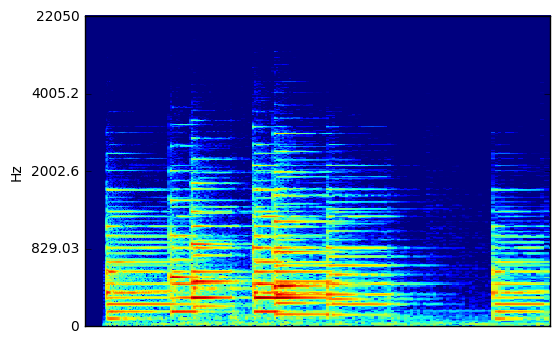

In [145]:
# Experiment with exponential sampling
indices, full = sample(ft.shape[1], block_size=64)
repeated = np.copy(ft[:, full])
print indices.shape, 'indices.shape', full.shape, 'full.shape', repeated.shape, 'repeated.shape'
# Render spectrogram of first 10 seconds
D = librosa.logamplitude(np.abs(repeated[:,:int(tf_fs * 10)])**2, ref_power=np.max)
librosa.display.specshow(D, sr=fs, cmap='jet', y_axis='log')
# Reconstruct
song = librosa.istft(repeated, win_length=window_size, hop_length=window_size / 4)
displayAudio(song, 'exponential downsampling', n_seconds=100)